# [ML4Science]GNN

In this exercise, we will practice how to use the graph-based model to make predictions of fluid motion.


![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F24644801%2Fb89e6ee2d57f0d0199b8429003a239e8%2F1141738278586_.pic.jpg?generation=1738278611318767&alt=media)

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as tri
import glob
from natsort import natsorted

Use this block to pull the data into the Colab environment. This will prompt you to log in to your Google account—please grant the necessary permissions. I assure you that this process is completely safe, and there are no viruses or malicious files involved.

In [6]:
# !pip -q install -U gdown   # فقط بار اول لازم است

import os, re, tarfile
import gdown

file_name = "data2.tar.gz"
file_dir = "/content"
file_path = os.path.join(file_dir, file_name)

share_link = "https://drive.google.com/file/d/1iAeoEG2Wg6gqSmwmC8JSyhZo-A2Yqsvg/view?usp=sharing"

# استخراج file_id هم برای لینک‌های /d/... هم ?id=...
m = re.search(r'/d/([A-Za-z0-9_-]+)', share_link) or re.search(r'[?&]id=([A-Za-z0-9_-]+)', share_link)
file_id = m.group(1)

# دانلود با gdown (نیازی به احراز هویت PyDrive نیست)
url = f"https://drive.google.com/uc?id={file_id}"
print("Downloading...")
gdown.download(url, file_path, quiet=False)

# باز کردن فایل tar.gz
if tarfile.is_tarfile(file_path):
    print("Extracting...")
    with tarfile.open(file_path, "r:*") as tar:
        tar.extractall(file_dir)   # اگر آرشیو ناشناس است، قبل از extract اعتبارسنجی کنید.
    print("Done!")
else:
    print(f"{file_path} یک فایل tar معتبر نیست.")


Downloading...


Downloading...
From (original): https://drive.google.com/uc?id=1iAeoEG2Wg6gqSmwmC8JSyhZo-A2Yqsvg
From (redirected): https://drive.google.com/uc?id=1iAeoEG2Wg6gqSmwmC8JSyhZo-A2Yqsvg&confirm=t&uuid=e3fe3ce1-f30e-45d3-bfcf-534f017b3282
To: /content/data2.tar.gz
100%|██████████| 405M/405M [00:06<00:00, 64.7MB/s]


Extracting...
Done!


## Load data

In [7]:
def load_data(data_path):
    data = np.load(data_path, allow_pickle=True).item()
    return data

In [8]:
data_path = "/content/data/train/data_02005.npy"

result = load_data(data_path)

for key, item in result.items():
    print(key, item.shape)

field_node (2051, 3)
coord (2051, 2)
edge_index_bi (2, 11858)
cell_node_list (3878, 3)
mask_bd (2051, 1)
mask_wall (2051, 1)
mask_inlet (2051, 1)
mask_outlet (2051, 1)
mask_object (2051, 1)


## Make animation

You will need to fill out the below function in charge of making an animation of the fluid dynamics, a example frame from the animation should looks something like:

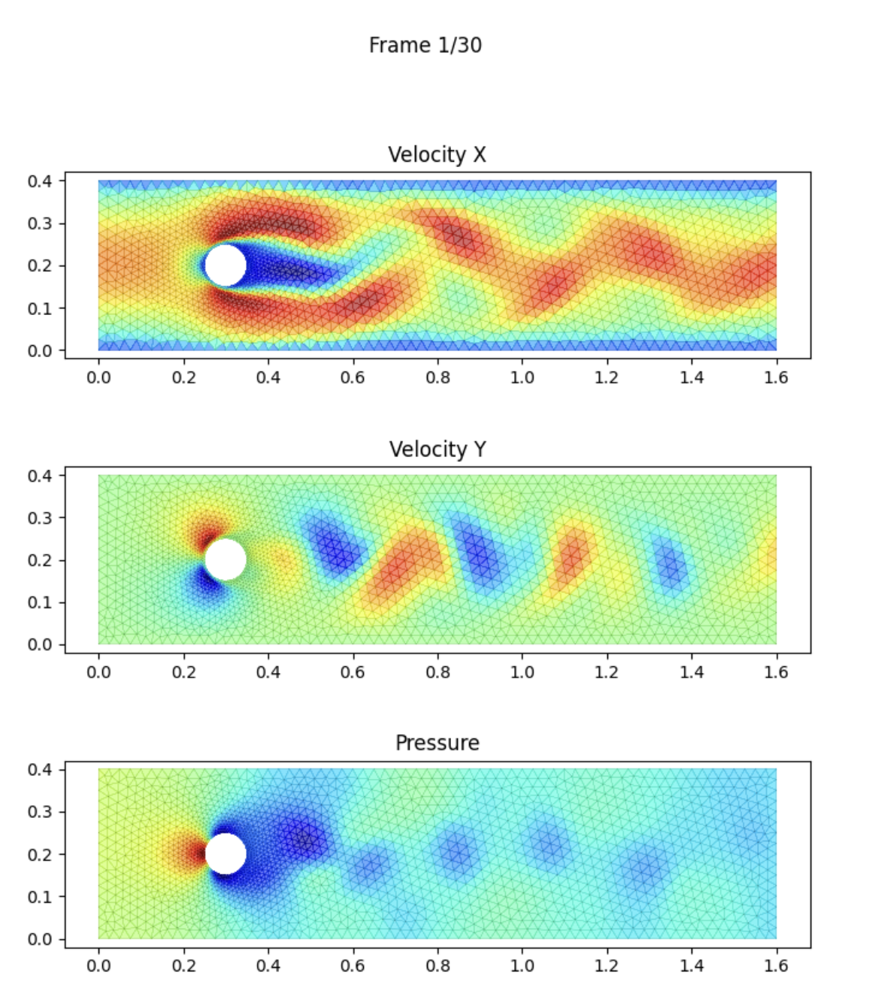

In [28]:
import matplotlib.animation as animation

def make_anim(field_list, coord, face, cmap="jet"):
    """
    Creates an animated visualization of field data over time using triangular mesh interpolation.

    Args:
        field_list (list): A list of NumPy arrays, each representing a field at different time steps.
        coord (numpy.ndarray): A (N, 2) array of node coordinates.
        face (numpy.ndarray): A (M, 3) array of indices representing triangular connectivity.
        cmap (str, optional): The colormap to use for visualization. Default is "jet".

    Returns:
        animation.FuncAnimation: The created animation object.

    Task:
    - Determine the number of frames from `field_list`.
    - Compute the bounding box (`left`, `right`, `bottom`, `top`) for visualization.
    - Create a `matplotlib.tri.Triangulation` object for the triangular mesh.
    - Set up a figure with three subplots, each representing:
        - "Velocity X"
        - "Velocity Y"
        - "Pressure"
    - Define an `update` function to:
        - Clear each subplot.
        - Update each field visualization at a given time step using `tripcolor`.
        - Overlay the mesh using `triplot`.
        - Update subplot titles and add a frame number.
    - Use `matplotlib.animation.FuncAnimation` to animate over all frames.

    Example:
        >>> ani = make_anim(field_list, coord, face)
        >>> plt.show()

    Note:
    - This is a demonstrative example. Feel free to modify and experiment with the animation parameters.
    - You can alter the colormap, frame update interval, or add more custom features.
    """

    # YOUR CODE HERE
    num_frames = len(field_list)
    left, right = np.min(coord[:, 0]), np.max(coord[:, 0])
    bottom, top = np.min(coord[:, 1]), np.max(coord[:, 1])

    zeta = 15
    width = zeta * (right - left)
    height = zeta * (top - bottom)

    triangle = tri.Triangulation(coord[:, 0], coord[:, 1], face)

    fig, axes = plt.subplots(3, 1, figsize=(width, height))
    titles = ["Velocity X", "Velocity Y", "Pressure"]

    def update(frame_idx):
        for i, ax in enumerate(axes):
            ax.clear()
            # YOUR CODE HERE
            ax.set_aspect("equal")
            ax.triplot(triangle, 'ko-', ms=0.1, lw=0.1)
            ax.tripcolor(triangle, field_list[frame_idx][:, i], cmap=cmap, alpha=0.4)
            ax.set_title(titles[i])
        fig.suptitle(f"Frame {frame_idx+1}/{num_frames}", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])


    ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=50, blit=False)

    return ani

In [1]:
from IPython.display import HTML

# Load file names in the train folder, and select the first 30 files
dataset_dir = "/content/data/train/"
file_names = glob.glob(os.path.join(dataset_dir, "data_*.npy"))
file_names = natsorted(file_names)[:30]
print(len(file_names))

# construct an list that stores field_node
field_node_list = [load_data(file_name)["field_node"] for file_name in file_names]

# get coordinates and face of a single data sample
sample = load_data(file_names[0])
coord = sample["coord"]
face = sample["cell_node_list"]

anim = make_anim(field_node_list, coord, face)
HTML(anim.to_jshtml())

NameError: name 'glob' is not defined

## Construct Edege Features

In [ ]:
def get_diff_and_norm(data):
    """
    Computes the positional differences and L2 norm of edges in a graph-based dataset.

    Args:
        data (dict): A dictionary containing:
            - "coord" (numpy.ndarray): A (N, 2) array of node coordinates.
            - "edge_index_bi" (numpy.ndarray): A (2, E) array representing bidirectional edges between nodes.

    Returns:
        tuple:
            - pos_diff (numpy.ndarray): A (E, 2) array representing the differences in positions between connected nodes.
            - pos_l2_norm (numpy.ndarray): A (E, 1) array representing the L2 norm of each edge's positional difference.

    Task:
    - Extract `coord` (node positions) and `edge_index_bi` (edge connections) from `data`.
    - Compute `source_pos` and `target_pos`:
        - Use `edge_index_bi` to index `coord`, extracting positions of source and target nodes.
    - Calculate `pos_diff`:
        - Subtract `source_pos` from `target_pos` to get edge-wise positional differences.
    - Compute `pos_l2_norm`:
        - Calculate the L2 norm (Euclidean distance) of `pos_diff` along the last axis.
        - Ensure the result has shape (E, 1) using `keepdims=True`.

    Example:
        >>> data = load_data("dataset.npy")
        >>> pos_diff, pos_l2_norm = get_diff_and_norm(data)
        >>> print(pos_diff.shape, pos_l2_norm.shape)

    Note:
    - This function is useful for graph-based learning tasks, where understanding edge relationships is crucial.
    - You can modify the norm computation to experiment with different distance metrics.
    """

    # YOUR CODE HERE

    return pos_diff, pos_l2_norm


In [ ]:
from tqdm import tqdm

def post_process(dataset_dir = "../data/data/Re_00100/train/"):
    file_names = glob.glob(os.path.join(dataset_dir, "data_*.npy"))
    file_names = natsorted(file_names)

    for file_name in tqdm(file_names, desc="Processing files"):
        data = load_data(file_name)
        pos_diff, pos_l2_norm = get_diff_and_norm(data)
        data["pos_diff"] = pos_diff
        data["pos_l2_norm"] = pos_l2_norm
        np.save(file_name, data)

add edge features to data files

In [ ]:
post_process(dataset_dir = "/content/data/train/")

Processing files: 100%|██████████| 3000/3000 [00:05<00:00, 530.52it/s]


In [ ]:
post_process(dataset_dir = "/content/data/test/")

Processing files: 100%|██████████| 500/500 [00:01<00:00, 485.52it/s]


In [ ]:
post_process(dataset_dir = "/content/data/val_task2/")


Processing files: 100%|██████████| 1/1 [00:00<00:00, 315.86it/s]


In [ ]:
data_path = "/content/data/train/data_02005.npy"

result = load_data(data_path)

for key, item in result.items():
    print(key, item.shape)

field_node (2051, 3)
coord (2051, 2)
edge_index_bi (2, 11858)
cell_node_list (3878, 3)
mask_bd (2051, 1)
mask_wall (2051, 1)
mask_inlet (2051, 1)
mask_outlet (2051, 1)
mask_object (2051, 1)
pos_diff (11858, 2)
pos_l2_norm (11858, 1)


In [ ]:
def get_mean_std(data_folder_path, key):
    """
    Computes the mean and standard deviation of a specified field across multiple dataset files.

    Args:
        data_folder_path (str): The path to the folder containing multiple `.npy` dataset files.
        key (str): The key corresponding to the data field to compute mean and standard deviation for.

    Returns:
        tuple:
            - mean (numpy.ndarray): The mean values computed across all datasets.
            - std (numpy.ndarray): The standard deviation values computed across all datasets.

    Task:
    - Retrieve all `.npy` files in `data_folder_path` that match `"data_*.npy"`.
    - Iterate through each file and:
        - Load the dataset using `load_data`.
        - Extract the field data using the provided `key`.
        - Append the extracted data to a list.
    - Concatenate all extracted field data arrays along the first axis.
    - Compute the mean and standard deviation across all concatenated data using `numpy.mean` and `numpy.std`, ensuring `keepdims=True`.

    Example:
        >>> mean, std = get_mean_std("dataset_folder", "field_node")
        >>> print(mean.shape, std.shape)

    Note:
    - Ensure the `key` exists in the dataset before computing statistics to avoid KeyErrors.
    - This function is flexible and can compute statistics for different fields.
    """

    # YOUR CODE HERE

    return mean, std


In [ ]:
field_node_mean, field_node_std = get_mean_std("/content/data/train/", "field_node")
pos_diff_mean, pos_diff_std = get_mean_std("/content/data/train/", "pos_diff")
pos_l2_norm_mean, pos_l2_norm_std = get_mean_std("/content/data/train/", "pos_l2_norm")

In [ ]:
print("\n📊 Training Data Normalization:")
print(f"Field: μ={field_node_mean}, σ={field_node_std}")
print(f"Pos Diff: μ={pos_diff_mean}, σ={pos_diff_std}")
print(f"Pos L2: μ={pos_l2_norm_mean}, σ={pos_l2_norm_std}\n")


📊 Training Data Normalization:
Field: μ=[[ 0.95287923 -0.00484783  0.08125565]], σ=[[0.60428063 0.31463532 0.47740318]]
Pos Diff: μ=[[ 3.59499150e-18 -1.19839656e-18]], σ=[[0.01394732 0.01372214]]
Pos L2: μ=[[0.01820149]], σ=[[0.00717849]]



## Dataset

In [ ]:
print(torch.cuda.is_available())
print(torch.__version__)

!pip install torch_geometric

# Optional dependencies:
!pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.5.0+cu124.html

In [ ]:
import torch
from torch_geometric.data import Data
from torch.utils.data import DataLoader, Dataset

class GraphData(Data):
    """
    Custom PyTorch Data object designed to handle mesh data features.

    This class is intended to be used as the base class of data samples
    returned by the MeshDataset.
    """
    GENERAL_DEFAULT_DTYPE = torch.float32  # Default to float for most attributes
    OVERRIDE_DTYPES = {
        "mask_bd": torch.int64,
        "mask_wall": torch.int64,
        "mask_inlet": torch.int64,
        "mask_outlet": torch.int64,
        "mask_object": torch.int64,
        "edge_index": torch.int64,
        "face_idx": torch.int64,
        "node_num": torch.int64,
    }

    def __setattr__(self, key, value):
        # Determine the default dtype for the attribute
        if torch.is_tensor(value):
            # Check if there's an override dtype for the attribute
            expected_dtype = self.OVERRIDE_DTYPES.get(key, self.GENERAL_DEFAULT_DTYPE)
            if value.dtype != expected_dtype:
                value = value.to(dtype=expected_dtype)
        super().__setattr__(key, value)

class GNNDataset(Dataset):
    """
    A custom PyTorch dataset for loading graph-structured mesh data.

    This dataset loads `.npy` files containing structured mesh data, applies
    transformations if provided, and returns a `GraphData` object for use in
    Graph Neural Networks (GNNs).

    Args:
        dataset_dir (str, optional): Path to the directory containing `.npy` dataset files.
        transform (callable, optional): A function to apply transformations to input data.
        target_transform (callable, optional): A function to apply transformations to target data.

    Attributes:
        file_names (list): A sorted list of file paths to dataset files.
        transform (callable): Transformation function for input data.
        target_transform (callable): Transformation function for target data.

    Task:
    - Implement `__init__`:
        - Load and sort `.npy` dataset files from `dataset_dir`.
    - Implement `__len__`:
        - Return half of the dataset length since data is paired sequentially.
    - Implement `load_data`:
        - Load an individual dataset file using `numpy.load`.
    - Implement `__getitem__`:
        - Retrieve input (`in_data`) and output (`out_data`) pairs:
            - Compute `in_idx` (even index) and `out_idx` (odd index).
            - Ensure `out_idx` is within range.
            - Load corresponding `.npy` files using `load_data`.
        - Apply transformations (`transform`, `target_transform`) if provided.
        - Construct a `GraphData` object with required attributes.
        - Return the `GraphData` sample.

    Example:
        >>> dataset = GNNDataset("dataset_folder")
        >>> dataloader = DataLoader(dataset, batch_size=8, shuffle=True)
        >>> for sample in dataloader:
        >>>     print(sample)

    Note:
    - This is a template for graph-based datasets. You can modify it to include additional features.
    """

    def __init__(self, dataset_dir=None, transform=None, target_transform=None):
        self.transform = transform
        self.target_transform = target_transform

        self.file_names = glob.glob(os.path.join(dataset_dir, "data_*.npy"))
        self.file_names = natsorted(self.file_names)

    def __len__(self):
        # YOUR CODE HERE

        return length

    def load_data(self, data_path):
        # YOUR CODE HERE
        return data

    def __getitem__(self, idx):
        # YOUR CODE HERE

        return sample


In [ ]:
dataset_dir = "/content/data/test/"

dataset = GNNDataset(dataset_dir)
print(len(dataset))

250


In [ ]:
class Normalise:
    def __init__(self, mean, std, key):
        self.mean = mean
        self.std = std
        self.key = key

    def __call__(self, data):
        data[self.key] = (data[self.key] - self.mean) / self.std
        return data

class ToTensor:
    """Convert numpy arrays to PyTorch tensors with correct dtype."""
    def __call__(self, data):
        for key in data:
            if isinstance(data[key], np.ndarray):
                # Convert to tensor with correct dtype
                if "mask" in key or "edge_index" in key or "face_idx" in key:
                    data[key] = torch.tensor(data[key], dtype=torch.int32)  # Integer tensors
                else:
                    data[key] = torch.tensor(data[key], dtype=torch.float32)  # Float tensors
        return data

class Compose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, data):
        for transform in self.transforms:
            data = transform(data)
        return data

In [ ]:
transform = Compose([
    Normalise(mean = field_node_mean, std = field_node_std, key="field_node"),
    Normalise(mean = pos_diff_mean, std = pos_diff_std, key="pos_diff"),
    Normalise(mean = pos_l2_norm_mean, std = pos_l2_norm_std, key="pos_l2_norm"),
    ToTensor(),
])

dataset = GNNDataset(dataset_dir = dataset_dir, transform=transform, target_transform=transform)

idx = 0
data_in = dataset[idx]

print(data_in)


GraphData(edge_index=[2, 11858], field_node_in=[2051, 3], field_node_out=[2051, 3], coord=[2051, 2], pos_diff=[11858, 2], pos_l2_norm=[11858, 1], mask_wall=[2051, 1], mask_inlet=[2051, 1], mask_outlet=[2051, 1], mask_object=[2051, 1])


## MGN model

Try to play with MGN and maybe tweak the model a little bit - does the tweak make the model more performant? if not, why? if so, why?es

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Sequential, Linear, ReLU
from torch_geometric.nn import MessagePassing
from torch_geometric.nn import global_mean_pool
from torch_geometric.nn import LayerNorm
import torch_scatter
class MeshGraphNet(torch.nn.Module):
    """
    MeshGraphNet model based on DeepMind's 2021 paper.

    This model follows a three-step architecture:
    1. **Preprocessing (Encoder)**:
       - Encodes raw node and edge inputs into latent embeddings.
    2. **Processing (Message Passing)**:
       - Uses a sequence of graph-based processors to update the latent embeddings.
    3. **Postprocessing (Decoder)**:
       - Converts latent node embeddings into physical output quantities.

    Args:
        input_dim_node (int): Dimension of node input features.
        input_dim_edge (int): Dimension of edge input features.
        output_dim (int): Dimension of output features (e.g., velocity changes).
        hidden_dim (int, optional): Dimension of hidden layers. Default is 10.
        num_layers (int, optional): Number of message-passing layers. Default is 10.

    Attributes:
        node_encoder (nn.Sequential): Encodes raw node inputs into latent node embeddings.
        edge_encoder (nn.Sequential): Encodes raw edge inputs into latent edge embeddings.
        processor (nn.ModuleList): A sequence of message-passing layers for updating node and edge embeddings.
        decoder (nn.Sequential): Converts latent node embeddings into final output values.

    Task:
    - Implement the `build_processor_model` method to return a `ProcessorLayer` function.
    - Implement the `forward` method:
        - Extract relevant data fields (e.g., `field_node`, `pos_diff`, `pos_l2_norm`, `edge_index`).
        - Concatenate masks into a single tensor and combine with `field_node`.
        - Encode node and edge features using `node_encoder` and `edge_encoder`.
        - Apply message-passing layers (`processor`) sequentially to update node and edge embeddings.
        - Decode final node embeddings into output values.
        - Return the sum of the decoded output and the original `field_node` values - this is called residual connection method, a common technique in

    Example:
        >>> model = MeshGraphNet(input_dim_node=6, input_dim_edge=3, output_dim=2)
        >>> data = GraphData(...)
        >>> output = model(data)
        >>> print(output.shape)

    Note:
    - This is a **demonstrative template** for educational purposes.
    - Feel free to experiment by modifying the architecture, hidden dimensions, and layer structures.
    """

    def __init__(self,
            input_dim_node,
            input_dim_edge,
            output_dim,
            hidden_dim=10,
            num_layers=10,
        ):
        super().__init__()  # Use the modern and simplified super() call

        self.num_layers = num_layers

        # Encoder: Converts raw inputs into latent embeddings
        self.node_encoder = Sequential(
                                Linear(input_dim_node, hidden_dim),
                                ReLU(),
                                Linear(hidden_dim, hidden_dim),
                                LayerNorm(hidden_dim)
                            )
        self.edge_encoder = Sequential(
                                Linear(input_dim_edge, hidden_dim),
                                ReLU(),
                                Linear(hidden_dim, hidden_dim),
                                LayerNorm(hidden_dim)
                            )

        # Processor: Message passing layers
        self.processor = nn.ModuleList()
        assert (self.num_layers >= 1), 'Number of message passing layers must be >= 1'
        processor_layer = self.build_processor_model()
        for _ in range(self.num_layers):
            self.processor.append(processor_layer(hidden_dim, hidden_dim))

        # Decoder: Converts latent node embeddings into output values
        self.decoder = Sequential(
                        Linear(hidden_dim, hidden_dim),
                        ReLU(),
                        Linear(hidden_dim, output_dim)
                    )

    def build_processor_model(self):
        return ProcessorLayer

    def forward(self, data):
        # YOUR CODE HERE


        return out + field_node
class ProcessorLayer(MessagePassing):
    """
    A message-passing layer for updating node and edge embeddings in a MeshGraphNet.

    This layer follows a two-step process:
    1. **Edge Update (message function)**:
       - Computes updated edge embeddings based on adjacent node embeddings.
       - Uses an MLP (`edge_mlp`) to process concatenated embeddings.
    2. **Node Update (aggregate function)**:
       - Aggregates edge features at each node using a summation operation.
       - Applies an MLP (`node_mlp`) to update node embeddings.

    Args:
        in_channels (int): Input dimension for node embeddings.
        out_channels (int): Output dimension for edge embeddings.
        **kwargs: Additional arguments for the `MessagePassing` parent class.

    Attributes:
        edge_mlp (nn.Sequential): MLP for processing edge features.
        node_mlp (nn.Sequential): MLP for processing node features.

    Task:
    - Implement `reset_parameters`:
        - Reset weights of MLP layers.
    - Implement `forward`:
        - Call `propagate` to update edge attributes and aggregate messages to nodes.
        - Apply `node_mlp` with residual connections.
    - Implement `message`:
        - Concatenate source node, target node, and edge embeddings.
        - Process them through `edge_mlp` with residual connections.
    - Implement `aggregate`:
        - Use `torch_scatter.scatter` to sum edge features at each node.

    Example:
        >>> layer = ProcessorLayer(128, 128)
        >>> x = torch.randn(10, 128)  # Node embeddings
        >>> edge_index = torch.randint(0, 10, (2, 20))  # Edge connections
        >>> edge_attr = torch.randn(20, 128)  # Edge features
        >>> updated_nodes, updated_edges = layer(x, edge_index, edge_attr)
        >>> print(updated_nodes.shape, updated_edges.shape)

    Note:
    - This layer is designed for **message-passing** in graph-based models.
    - Feel free to modify the aggregation method (e.g., mean instead of sum).
    """

    def __init__(self, in_channels, out_channels, **kwargs):
        super(ProcessorLayer, self).__init__(**kwargs)

        # Edge MLP: Processes concatenated (source, target, edge) embeddings
        self.edge_mlp = Sequential(
                            Linear(3 * in_channels, out_channels),
                            ReLU(),
                            Linear(out_channels, out_channels),
                            LayerNorm(out_channels)
                        )

        # Node MLP: Processes aggregated edge features
        self.node_mlp = Sequential(
                            Linear(2 * in_channels, out_channels),
                            ReLU(),
                            Linear(out_channels, out_channels),
                            LayerNorm(out_channels)
                        )

        self.reset_parameters()

    def reset_parameters(self):
        """
        Resets the parameters of MLP layers to ensure proper training initialization.
        """
        YOUR CODE HERE
        self.edge_mlp[0].reset_parameters()
        self.edge_mlp[2].reset_parameters()
        self.node_mlp[0].reset_parameters()
        self.node_mlp[2].reset_parameters()

    def forward(self, x, edge_index, edge_attr, size=None):
        """
        Handles node and edge feature updates via message passing.

        Args:
            x (torch.Tensor): Node embeddings, shape `[N, in_channels]`.
            edge_index (torch.Tensor): Edge connections, shape `[2, E]`.
            edge_attr (torch.Tensor): Edge attributes, shape `[E, in_channels]`.
            size (tuple, optional): Tuple specifying number of nodes and edges.

        Returns:
            tuple:
                - Updated node embeddings `[N, out_channels]`.
                - Updated edge embeddings `[E, out_channels]`.
        """
        # YOUR CODE HERE

        return updated_nodes, updated_edges

    def message(self, x_i, x_j, edge_attr):
        """
        Constructs messages to pass along graph edges.

        Args:
            x_i (torch.Tensor): Source node embeddings, shape `[E, in_channels]`.
            x_j (torch.Tensor): Target node embeddings, shape `[E, in_channels]`.
            edge_attr (torch.Tensor): Edge embeddings, shape `[E, out_channels]`.

        Returns:
            torch.Tensor: Updated edge embeddings `[E, out_channels]`.
        """
        # YOUR CODE HERE
        return updated_edges

    def aggregate(self, updated_edges, edge_index, dim_size=None):
        """
        Aggregates messages from edges to nodes.

        Args:
            updated_edges (torch.Tensor): Updated edge embeddings `[E, out_channels]`.
            edge_index (torch.Tensor): Edge connections `[2, E]`.
            dim_size (int, optional): Number of nodes.

        Returns:
            torch.Tensor: Aggregated node embeddings `[N, out_channels]`.
        """
        node_dim = 0  # Index along nodes
        out = torch_scatter.scatter(updated_edges, edge_index[0, :], dim=node_dim, reduce='sum')
        return out, updated_edges



## Model Training

In [ ]:
model = MeshGraphNet(
            input_dim_node=7,
            input_dim_edge=3,
            output_dim=3
)
sample = dataset[0]
out = model(sample)
print(out.shape)

torch.Size([2051, 3])


In [ ]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    avg_loss = 0.0
    for batch in loader:
        in_data = batch
        in_data = in_data.to(device)
        out_data = in_data.field_node_out
        optimizer.zero_grad()
        pred = model(in_data)
        loss = criterion(pred, out_data)
        avg_loss += loss.item()
        loss.backward()
        optimizer.step()
    avg_loss /= len(loader)
    return loss, model


def test_one_epoch(model, loader, criterion):
    model.eval()
    avg_loss = 0.0
    with torch.no_grad():
        for batch in loader:
            in_data = batch
            in_data = in_data.to(device)
            out_data = in_data.field_node_out
            pred = model(in_data)
            loss = criterion(pred, out_data)
            avg_loss += loss.item()
    avg_loss /= len(loader)
    return loss




def train(epoch, model, optimizer, loader_train, loader_test):
    criterion = torch.nn.MSELoss()
    model = model.to(device)
    for i in range(epoch):
        loss, model = train_one_epoch(
            model=model, loader=loader_train, optimizer=optimizer, criterion=criterion)
        print(f"Epoch \t{i+1}, Train Loss \t{loss}")
        if (i+1) % 100 == 0:
            info = test_one_epoch(
                model=model, loader=loader_test, criterion=criterion)
            print(f"\t Epoch \t{i+1}, Test Loss \t{loss}")
            model_path = os.path.join(
                os.path.abspath("."),
                f"epoch_{i+1}.pth"
            )
            torch.save(model.state_dict(), model_path)
            print(model_path, "saved")


In [ ]:
from torch_geometric.loader import DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Tune the hyperparameters here

# batch_size = 16
# lr = 1e-3
# epoch = 300
# weight_decay=5e-5

model = MeshGraphNet(
            input_dim_node=7,
            input_dim_edge=3,
            output_dim=3
)

dataset_train = GNNDataset(dataset_dir = "/content/data/train/", transform=transform, target_transform=transform)
dataset_test = GNNDataset(dataset_dir = "/content/data/test/", transform=transform, target_transform=transform)
loader_train = DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True, num_workers=4
)
loader_test = DataLoader(
    dataset_test, batch_size=batch_size, shuffle=True, num_workers=4
)

# Try different optimisers here

# Init optimizer
# optimizer = torch.optim.Adam(
#     model.parameters(),
#     lr=lr,
#     weight_decay=weight_decay,
# )

In [ ]:
train(epoch=epoch,
      model=model,
      optimizer=optimizer,
      loader_train=loader_train,
      loader_test=loader_test
    )

In [ ]:
def load_model(model, weight_path, strict=False):
    """
    Loads pre-trained weights into a PyTorch model from a given file path.

    Args:
        model (torch.nn.Module): The PyTorch model.
        weight_path (str): File path to the pre-trained model weights.

    Returns:
        torch.nn.Module: The model with loaded weights.
    """
    try:
        model.load_state_dict(torch.load(weight_path), strict=strict)
    except RuntimeError:
        state_dict = torch.load(weight_path, map_location=device)
        model.load_state_dict(state_dict, strict=strict)
    return model


def denormalise(data, mean, std):
    mean = mean[(...,) + (None,) * (data.ndim - mean.ndim)]
    std = std[(...,) + (None,) * (data.ndim - std.ndim)]
    return data * std + mean


def calc_norm_error(pred, truth, ord=2):
    """
    Compute the relative error of two input. input are supposed to have
    shape of (channel, height, width). Other shape might work but please
    be careful and aware of what you are doing.

    pred: The prediction output by model.
    truth: The ground truth against which error are measured.
    ord: the order of norm.
    """
    pred, truth = [vec.flatten() for vec in [pred, truth]]
    nume = torch.linalg.norm((pred - truth), ord=ord)
    deno = torch.linalg.norm(truth, ord=ord)
    return nume / deno


def calculate_error_and_inference(dataloader, model, mean, std):
    model.to(device)
    model.eval()
    error = 0.0
    pred_list = []
    ground_list = []
    with torch.no_grad():
        for batch in dataloader:
            data_in = batch
            data_in = data_in.to(device)
            target = data_in.field_node_out
            pred = model(data_in)
            pred, target = denormalise(pred, mean, std), denormalise(target, mean, std)
            pred_list.append(pred.detach().cpu().numpy())
            ground_list.append(target.detach().cpu().numpy())
            error_i = calc_norm_error(pred, target)
            error += error_i.detach()

    error /= (len(dataloader))
    return error, pred_list, ground_list

In [ ]:
model = MeshGraphNet(
            input_dim_node=7,
            input_dim_edge=3,
            output_dim=3
)

model = load_model(model, "./epoch_100.pth")
dataset_test = GNNDataset(
    dataset_dir = "/content/data/test/",
    transform=transform, target_transform=transform)
test_loader = DataLoader(dataset_test, batch_size=1, num_workers=8)

error, pred, ground = calculate_error_and_inference(
    test_loader, model,
    mean = torch.tensor(field_node_mean).to(device),
    std = torch.tensor(field_node_std).to(device),
)
print(error)

<ipython-input-44-e536121991fb>:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weight_path), strict=strict)


tensor(0.0067, device='cuda:0', dtype=torch.float64)


## Visulise single prediction

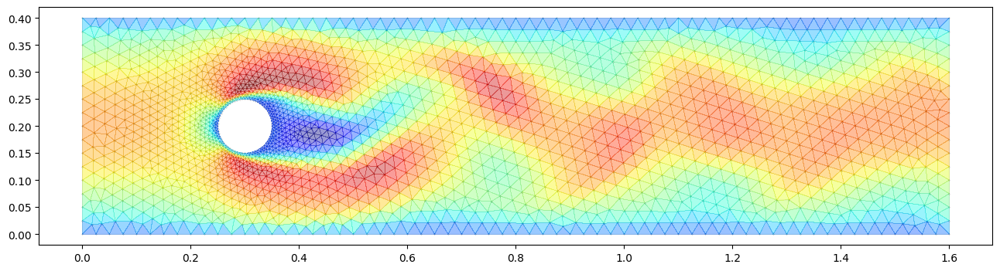

In [ ]:
import matplotlib.tri as tri
cmap = "jet"
zeta = 10
left, right = min(coord[:, 0]), max(coord[:, 0])
bottom, top = min(coord[:, 1]), max(coord[:, 1])
value = pred[10][:, 0]

width = zeta * (right - left)
height = zeta * (top - bottom)

triangle = tri.Triangulation(coord[:, 0], coord[:, 1], face)

fig, ax = plt.subplots(figsize=(width, height))

ax.set_aspect("equal")
ax.triplot(triangle, 'ko-', ms=0.1, lw=0.1)
ax.tripcolor(triangle, value, cmap=cmap, alpha=0.4)

## Auto Regressive Prediction

In [ ]:
def auto_regressive_pred(model, data, step=20):
    """
    Performs autoregressive prediction using the given model.

    This function iteratively predicts future states by feeding the model's own
    predictions back as input for the next step.

    Args:
        model (torch.nn.Module): The trained model used for prediction.
        data (GraphData): The input graph data containing initial conditions.
        step (int, optional): The number of autoregressive steps to perform. Default is 20.

    Returns:
        list: A list of predicted field states over `step` iterations.

    Task:
    - Move `data` and `model` to the appropriate `device` (GPU or CPU).
    - Set the model to evaluation mode (`model.eval()`).
    - Initialize an empty list `pred_list` to store predictions.
    - Extract wall, object, and inlet masks from `data`.
    - Store the initial inlet values separately to enforce boundary conditions.
    - Perform autoregressive prediction over `step` iterations:
        - Predict the next step using `model(data)`.
        - Denormalize the predicted field values.
        - Store the predicted values in `pred_list`.
        - Update `data.field_node_in` with the predicted values for the next step.
    - Return the list of predictions.

    Example:
        >>> model = MeshGraphNet(...)
        >>> data = GraphData(...)
        >>> predictions = auto_regressive_pred(model, data, step=50)
        >>> print(len(predictions))  # Should be 50

    Note:
    - Ensure the model and data are moved to the correct device before inference.
    - This is a **demonstrative template**—feel free to experiment with different step sizes.
    """

    # YOUR CODE HERE

    return pred_list


In [ ]:
# Load sample data to do validation
sample = load_data("/content/data/val_task2/data_21000.npy")

sample["field_node"] = (sample["field_node"] - field_node_mean) / field_node_std
sample["pos_diff"] = (sample["pos_diff"] - pos_diff_mean) / pos_diff_std
sample["pos_l2_norm"] = (sample["pos_l2_norm"] - pos_l2_norm_mean) / pos_l2_norm_std

sample = GraphData(
        field_node_in = torch.tensor(sample["field_node"], dtype=torch.float32),
        field_node_out = torch.tensor(sample["field_node"], dtype=torch.float32),
        edge_index = torch.tensor(sample["edge_index_bi"], dtype=torch.int32),
        coord = torch.tensor(sample["coord"], dtype=torch.float32),
        pos_diff = torch.tensor(sample["pos_diff"], dtype=torch.float32),
        pos_l2_norm = torch.tensor(sample["pos_l2_norm"], dtype=torch.float32),
        mask_wall = torch.tensor(sample["mask_wall"], dtype=torch.int32),
        mask_inlet = torch.tensor(sample["mask_inlet"], dtype=torch.int32),
        mask_outlet = torch.tensor(sample["mask_outlet"], dtype=torch.int32),
        mask_object = torch.tensor(sample["mask_object"], dtype=torch.int32),
)

pred_list = auto_regressive_pred(model, sample)

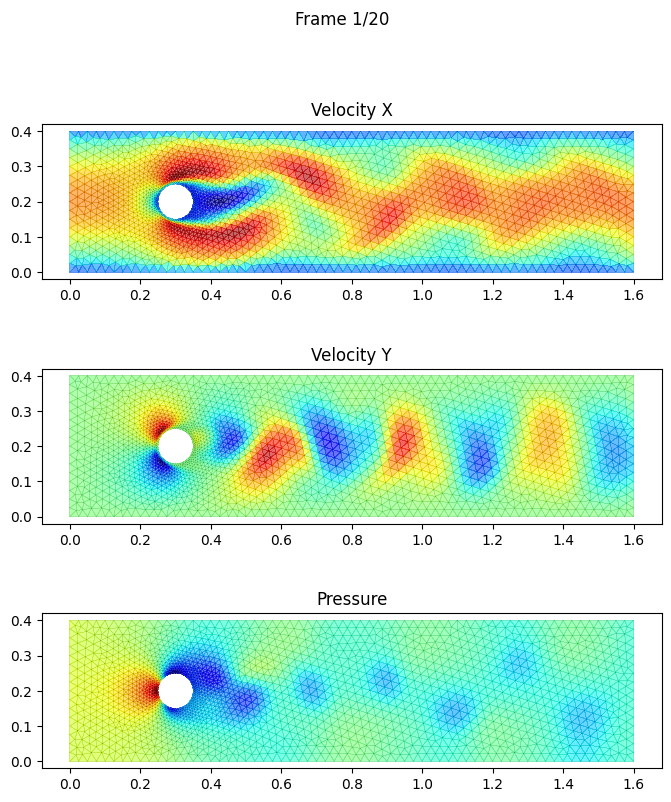

In [ ]:
from IPython.display import HTML
import matplotlib as mpl

mpl.rcParams['animation.embed_limit'] = 500  # Set limit in MB

sample = sample = load_data("/content/data/val_task2/data_21000.npy")
coord = sample["coord"]
face = sample["cell_node_list"]

anim = make_anim(pred_list, coord, face)
HTML(anim.to_jshtml())

## Submision file

In [ ]:
import pandas as pd

def pred_to_df(data):
    reshaped = data.reshape(-1, 3)
    df = pd.DataFrame(reshaped, columns=['Feature_1', 'Feature_2', 'Feature_3'])
    df.index.name = "ROW_ID"
    return df

# save file for submission 1
pred_1 = np.stack(pred_list, axis=0)


np.save("pred.npy", pred_1)

pred_df = pred_to_df(pred_1)

pred_df.to_csv("pred.csv", index=True)